# Property Prices Estimation for Seatle, Washington

# About Data Set

The dataset "kc_house_data" contains data on home sales in Seattle, Washington in 2014-2015. It is not specified exactly when the dataset was collected, but the description of the dataset states that home sales took place between May 2014 and May 2015.


**Feature Columns**
    
* id - Unique ID for each home sold
* date - Date of the home sale
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

**Target**
* price - Price of each home sold

# Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [2]:
#!pip install folium # It is a nice library to reflect the data on the map.

# Read Dataset

In [3]:
df = pd.read_csv("kc_house_data.csv")

# Exploratory Data Analysis and Visualization

## Take a Look to Dataset

In [4]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


In [5]:
df.tail()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21592,263000018,5/21/2014,360000.000,3,2.500,1530,1131,3.000,0,0,3,8,1530,0,2009,0,98103,47.699,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.000,4,2.500,2310,5813,2.000,0,0,3,8,2310,0,2014,0,98146,47.511,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.000,2,0.750,1020,1350,2.000,0,0,3,7,1020,0,2009,0,98144,47.594,-122.299,1020,2007
21595,291310100,1/16/2015,400000.000,3,2.500,1600,2388,2.000,0,0,3,8,1600,0,2004,0,98027,47.535,-122.069,1410,1287
21596,1523300157,10/15/2014,325000.000,2,0.750,1020,1076,2.000,0,0,3,7,1020,0,2008,0,98144,47.594,-122.299,1020,1357


In [7]:
df.sample(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
11624,2215901230,5/7/2015,254000.000,3,2.000,1470,7694,1.000,0,0,4,7,1470,0,1992,0,98038,47.354,-122.054,1580,7480
17950,1555300530,7/14/2014,240000.000,3,1.500,1010,10350,1.000,0,0,3,7,1010,0,1969,0,98032,47.379,-122.290,1640,7700
7084,1912100882,7/30/2014,482000.000,2,2.250,1350,1248,2.000,0,0,3,7,1180,170,2000,0,98102,47.640,-122.320,1760,3360
3393,2721049059,5/28/2014,225000.000,3,2.000,2030,24829,1.000,0,0,4,7,1220,810,1979,0,98001,47.272,-122.291,1980,15204
17713,1026069095,6/24/2014,839000.000,3,2.500,3200,203425,1.000,0,0,3,10,3200,0,2000,0,98077,47.761,-122.015,3200,203425


## Info

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

## Null Check

In [20]:
df.isnull().sum().any()

False

## Descriptpve Statistics

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


## Drop the Id_number

In [5]:
df = df.drop('id', axis = 1) # id'yi drop edelim

## Look at the "Price"

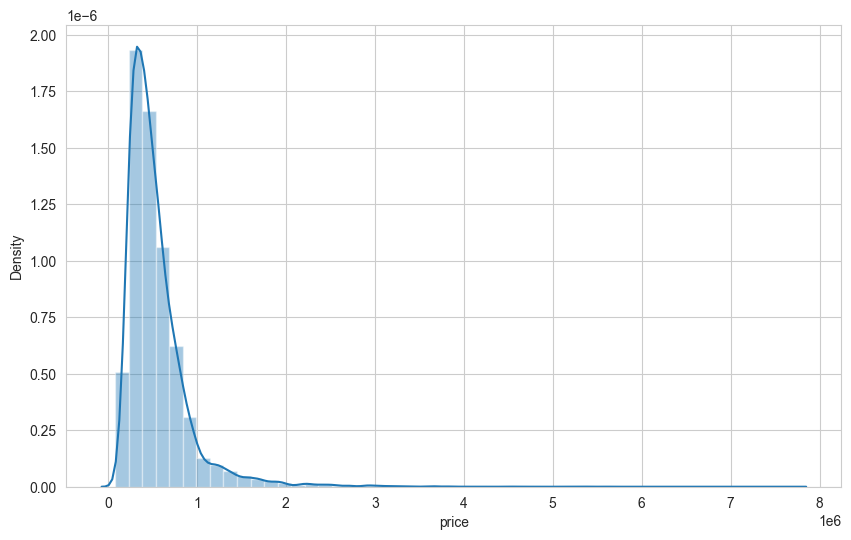

In [9]:
# let's look at the distribution of price;
sns.distplot(df['price']); 

In [12]:
# Let's look at those priced over 3 million;
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [10]:
df.groupby("waterfront").mean().T # 0 who do not look at water, 1 who look at water

waterfront,0,1
price,531762.324,1662524.184
bedrooms,3.374,3.301
bathrooms,2.112,2.678
sqft_living,2072.007,3173.687
sqft_lot,15021.290,25371.828
floors,1.493,1.641
view,0.207,3.767
condition,3.409,3.534
grade,7.649,8.773
sqft_above,1783.392,2473.043


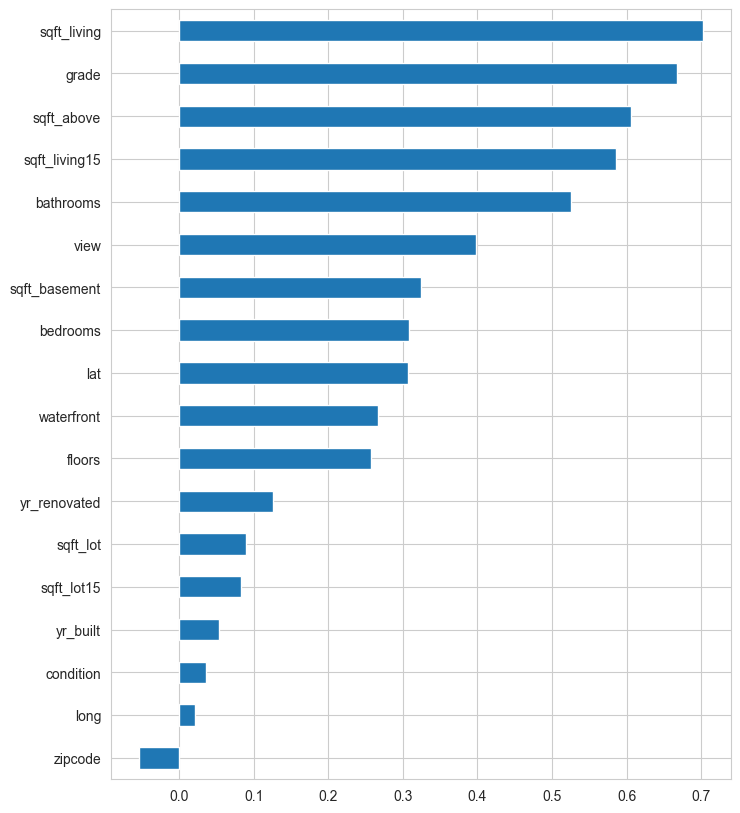

In [11]:
# Correlations of "features" with "prices";

plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");

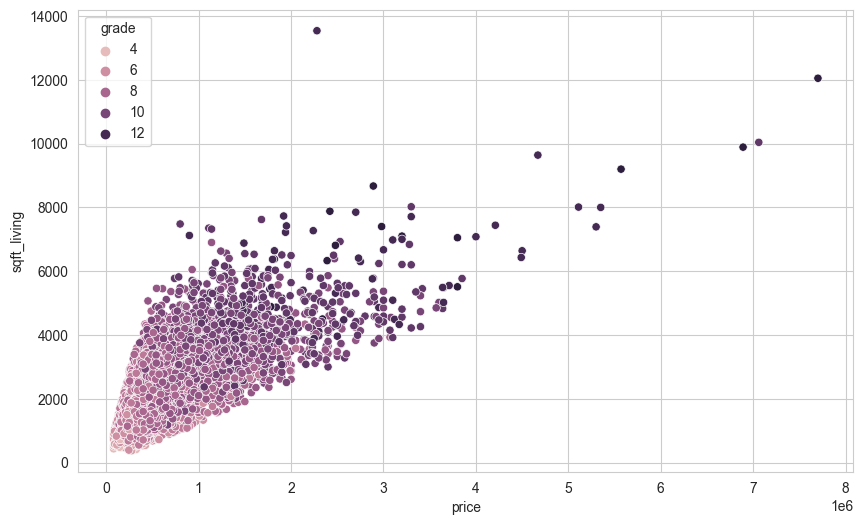

In [12]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");

## Look at the "Bedrooms"

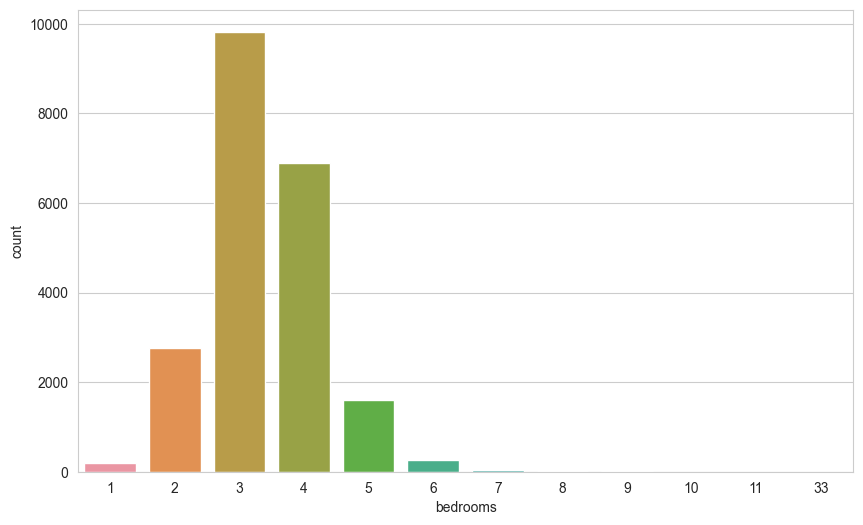

In [13]:
sns.countplot(df['bedrooms']);

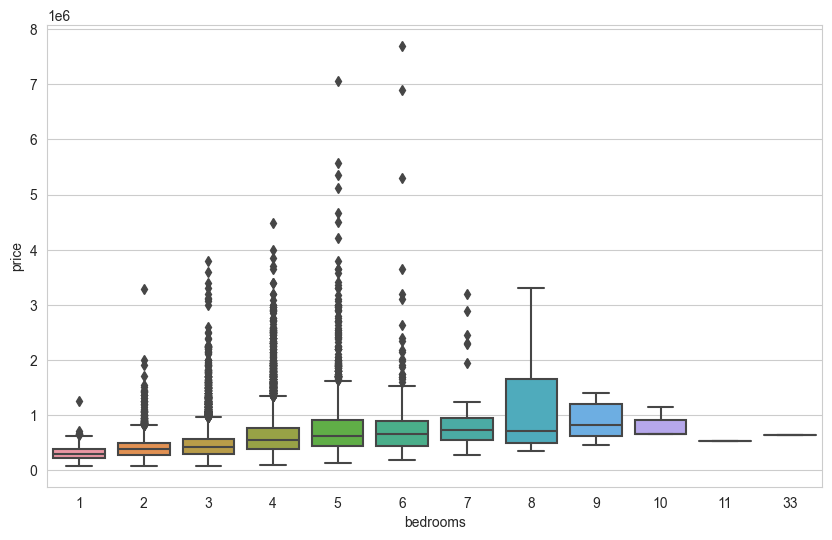

In [14]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [15]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [25]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [6]:
df.shape

(21597, 20)

## Focus on the "Date" Column

In [27]:
df['date'].dtype #datatype Object

dtype('O')

In [7]:
df['date'] = pd.to_datetime(df['date']) 
# We changed the date part from "object" to "datetime" so that we can extract 
# and use the date data in this column in the next operations.

In [29]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [8]:
df['year'] = df['date'].dt.year # Let's take the year information
#df['year'] = df['date'].apply(lambda date : date.year)

In [9]:
df['month'] = df['date'].dt.month # Let's take the month information

In [32]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


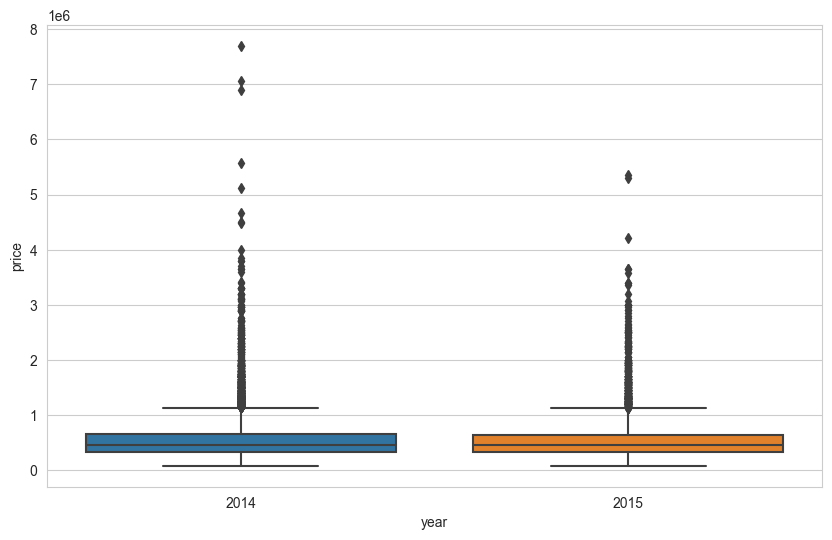

In [25]:
sns.boxplot(x = 'year', y = 'price', data = df);

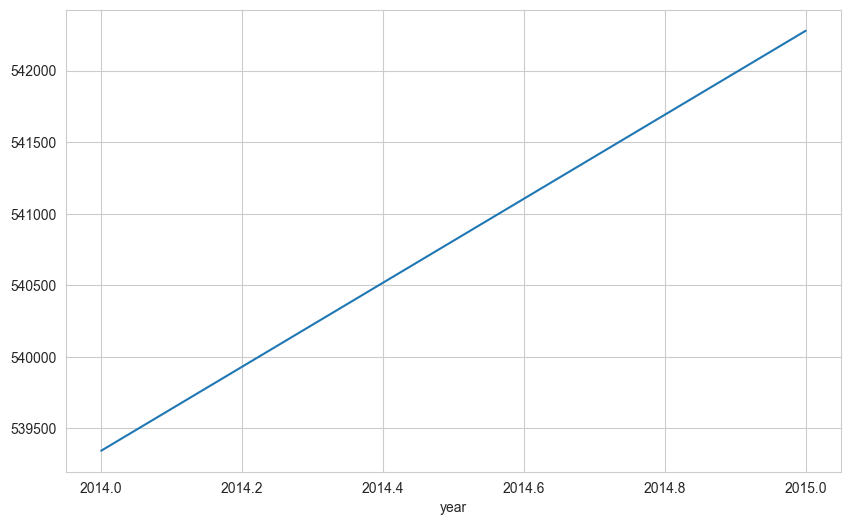

In [26]:
df.groupby('year')['price'].mean().plot();

* Prices seem to increase linearly over time.

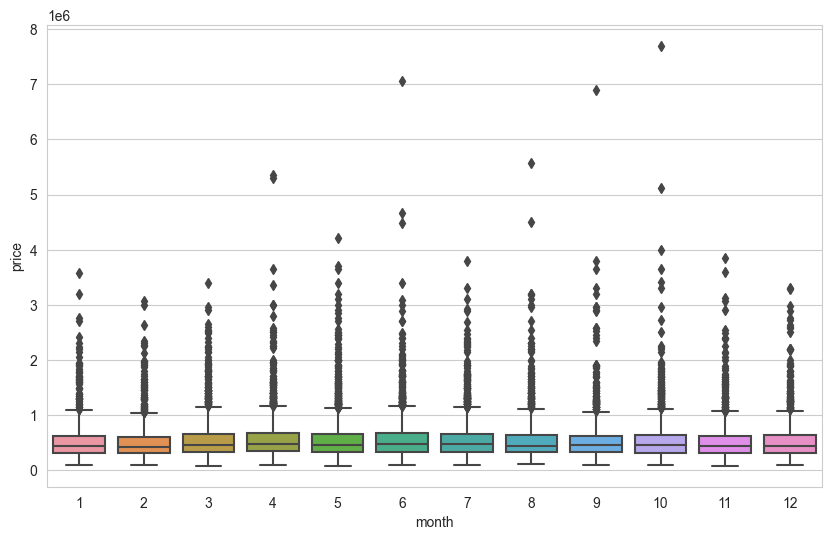

In [27]:
sns.boxplot(x = 'month', y = 'price', data = df);

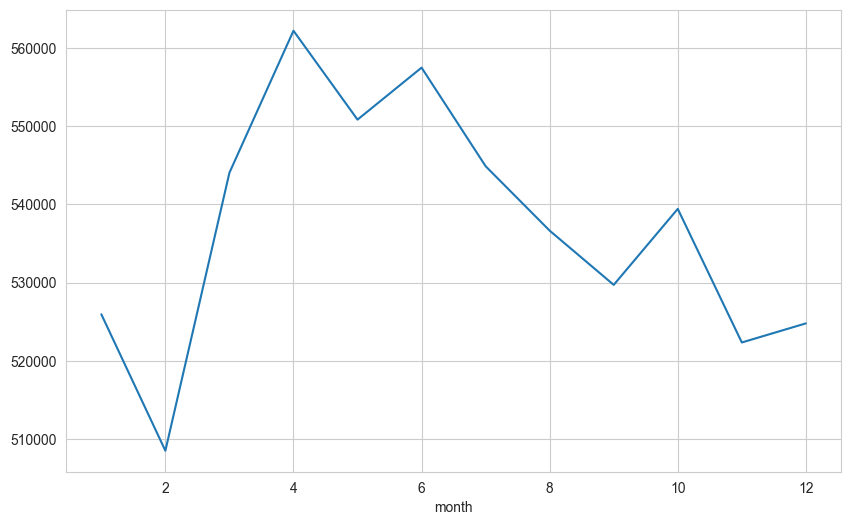

In [28]:
df.groupby('month')['price'].mean().plot();

* Prices seem to be lower in winter.

In [10]:
# Let's apply the get_dummies on "month";

month_dummy = pd.get_dummies(df["month"], prefix = "month") 
df = pd.concat([df, month_dummy], axis = 1)
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10,0,0,0,0,0,0,0,0,0,1,0,0
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2,0,1,0,0,0,0,0,0,0,0,0,0
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2,0,1,0,0,0,0,0,0,0,0,0,0


In [11]:
# Let's drop the data we no longer need;
df = df.drop(['date', "year", "month"], axis = 1)# 

## Focus on the "zipcode"

In [12]:
# Let's drop the "zipcode" data we no longer need;
df['zipcode'].value_counts(dropna = False)

98103    602
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [13]:
df = df.drop('zipcode', axis = 1)

## Focus on the "yr_renovated & yr_built"

In [14]:
# This is the last year the houses were renovated (restored).
df['yr_renovated'].value_counts(dropna = False) 

0       20683
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [15]:
# This is the building year of the houses;
df['yr_built'].value_counts(dropna = False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

could make sense due to scaling, higher should correlate to more value

## Focus on the "sqft_basement"

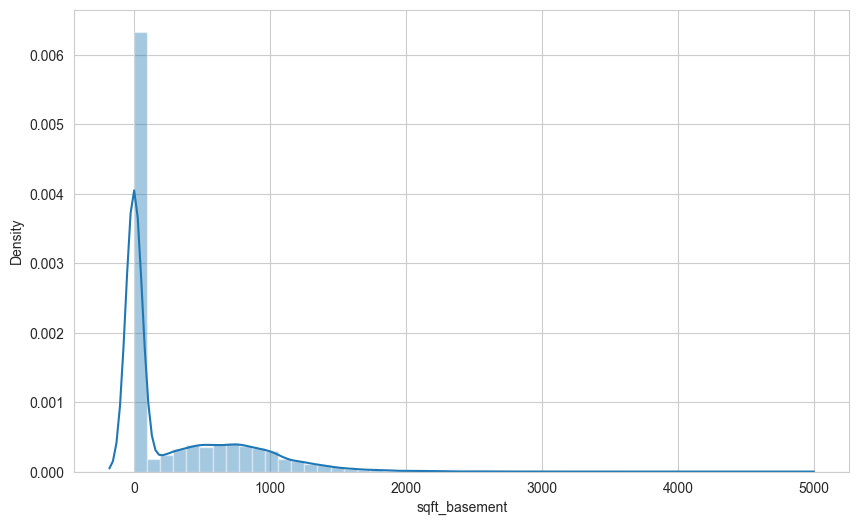

In [36]:
sns.distplot(df['sqft_basement']);

In [16]:
df['sqft_basement'].value_counts(dropna = False)

0      13110
600      221
700      218
500      214
800      206
       ...  
518        1
374        1
784        1
906        1
248        1
Name: sqft_basement, Length: 306, dtype: int64

In [38]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,47.557,-122.210,3270,10454,0,0,0,0,0,1,0,0,0,0,0,0
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,1991,0,47.593,-122.086,4913,14663,0,0,0,0,0,0,0,1,0,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,1980,0,47.576,-122.242,4480,16471,0,0,0,0,0,0,0,0,1,0,0,0


could make sense due to scaling, higher should correlate to more value

## Focus on the "sqft_above"

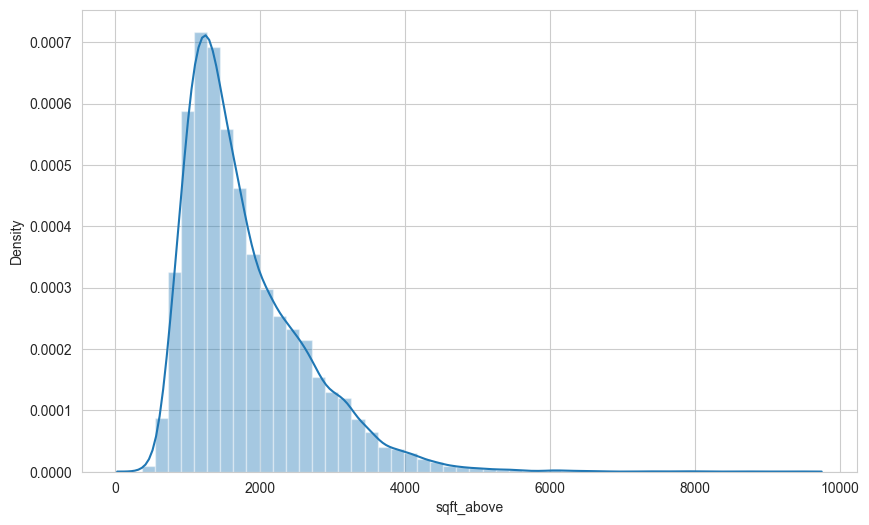

In [39]:
sns.distplot(df['sqft_above']);

In [17]:
df['sqft_above'].value_counts(dropna = False)

1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
3674      1
2979      1
2382      1
6290      1
1425      1
Name: sqft_above, Length: 942, dtype: int64

In [41]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,2001,0,47.568,-122.189,4160,18969,0,0,0,0,0,0,1,0,0,0,0,0
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,1996,0,47.733,-122.362,2740,10761,1,0,0,0,0,0,0,0,0,0,0,0
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,2006,0,47.541,-121.982,6210,95832,1,0,0,0,0,0,0,0,0,0,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,2002,0,47.455,-121.764,5610,169549,1,0,0,0,0,0,0,0,0,0,0,0
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,1992,0,47.447,-122.086,3270,34500,0,0,0,0,0,0,1,0,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0


## Look at he Geographical Properties

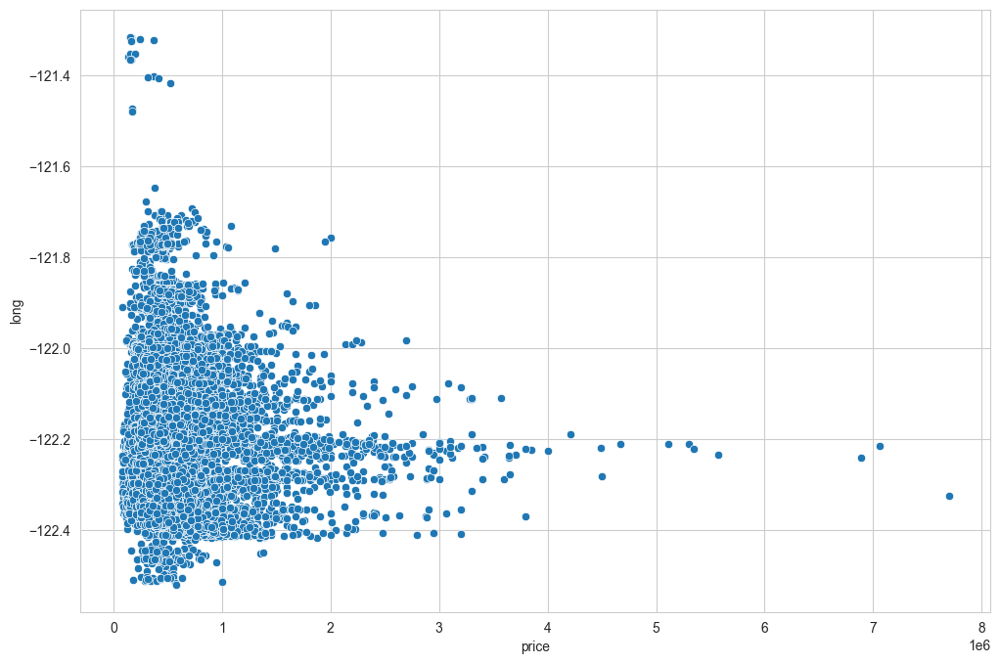

In [43]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

* Between longitudes 122.2-122.3, houses are more expensive.

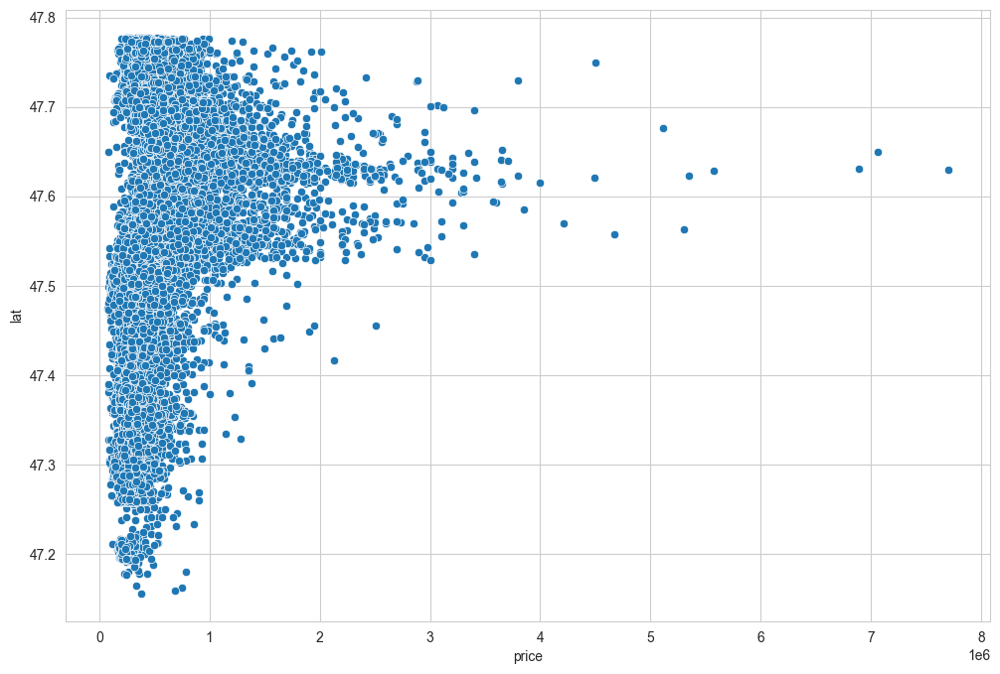

In [44]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

* Between latitudes 47.6-47.7, houses are more expensive

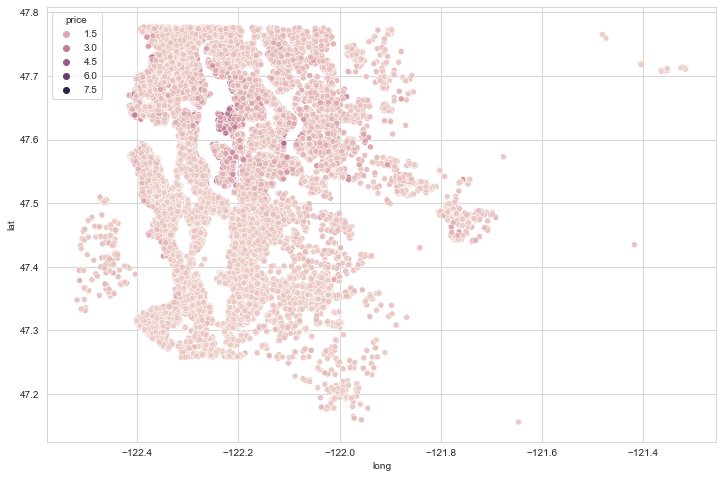

In [45]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

In [18]:
df.sort_values('price', ascending = False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,2007,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,2007,0,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,1990,0,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,1951,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0


In [19]:
len(df) * (0.01)

215.97

This code appears to be used to calculate the number of data points that correspond to 1 percent of a data frame. len(df) gives the total number of data points in the data frame. 0.01 is the decimal value of 1 percent.

For example, if there are 1000 data points in the data frame, this script calculates len(df) * 0.01 to represent 10 data points. This would be the number of data points corresponding to 1 percent of the data frame.

In [47]:
# Homes not in the top 1% price quintile;
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]

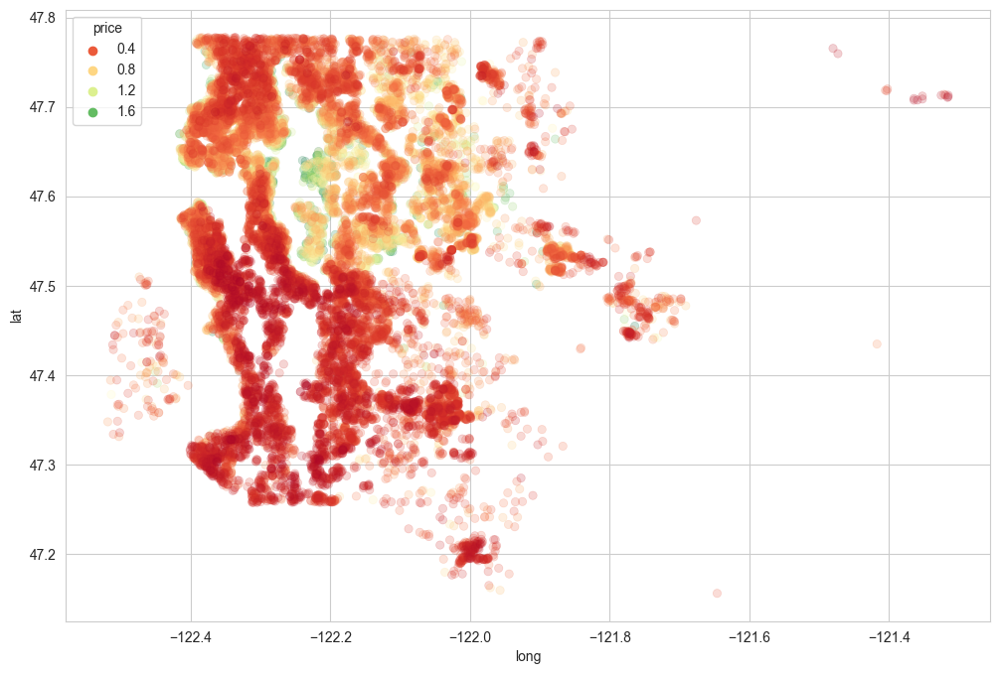

In [48]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

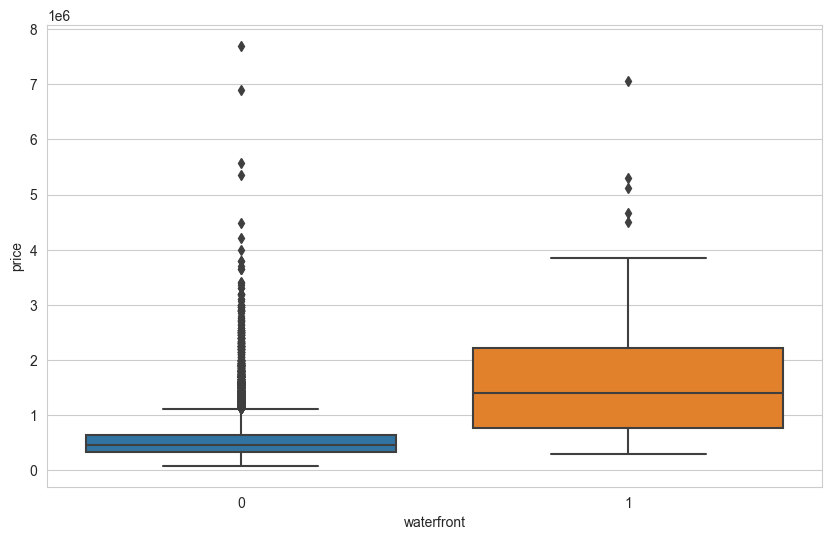

In [49]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

## Folium 

In [20]:
#pip install folium

In [21]:
import folium
import branca.colormap as cm

In [22]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [17]:
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [18]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)
colormap = cm.StepColormap(colors=["green","yellow","orange","red"] ,
                           index=[step_1, step_2, step_3, step_4, step_5],
                           vmin=step_1,
                           vmax=step_5)
for loc, p in zip(zip(df['lat'], df['long']),df["price"]):
      folium.Circle(
      location=loc,
      radius=1, #yarıçap
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m


## Latest Data

In [23]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,1
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1,0,0,0,0,0,0,0,0,0,0


In [24]:
df.shape

(21597, 30)

## Export Data
Let's export the correct version of the data set;

In [25]:
df.to_csv("df_last.csv", index = False)

In [26]:
# Let's reread the data we just exported; 
df = pd.read_csv("df_last.csv")
df.head(3)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0


# Deep Learning Time

## Preprocessing of Data
- Train | Test Split, Scalling

In [27]:
from sklearn.model_selection import train_test_split

In [28]:
X = df.drop('price', axis = 1)
y = df['price']

In [29]:
seed = 101

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed)

In [31]:
from sklearn.preprocessing import MinMaxScaler  

# If there are too many outliers in the data, robust scaler (RobustScaler()) 
# should be used, otherwise minmax can be used.

In [32]:
scaler = MinMaxScaler()

In [33]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [46]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [47]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score

In [48]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [36]:
X_train.shape

(19437, 29)

In [37]:
tf.random.set_seed(seed) # It ensures that when generating a random number, it goes around a certain kernel so that everyone gets the same result.

model = Sequential() # We will use a layered, sequential structure.

model.add(Dense(32, activation = 'relu')) # We did not give input information, let it determine itself.  
model.add(Dense(32, activation = 'relu')) # We said that the number of neurons in the first hidden layer should be 32.  
model.add(Dense(16, activation = 'relu')) # As an activation function, relu is often used in the intermediate steps.  
model.add(Dense(8, activation = 'relu'))  # It is a "best practice" to reduce the number of neurons in the hidden layers towards the end.
model.add(Dense(1))      # There is a "linear" as an activation function as default.

model.compile(optimizer = 'adam', loss = 'mse') 

In [38]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000) # If you give epoch=1000, it takes approximately 20-25 minutes. 
# It shows how much of the data in the train data we have evaluated as validation. 
# Cross-Valuiidation rate.

Epoch 1/1000
130/130 [==============================] - 2s 5ms/step - loss: 424152793088.0000 - val_loss: 450622685184.0000
Epoch 2/1000
130/130 [==============================] - 0s 4ms/step - loss: 418390474752.0000 - val_loss: 431066480640.0000
Epoch 3/1000
130/130 [==============================] - 0s 4ms/step - loss: 353842233344.0000 - val_loss: 297189441536.0000
Epoch 4/1000
130/130 [==============================] - 0s 4ms/step - loss: 175903309824.0000 - val_loss: 126044913664.0000
Epoch 5/1000
130/130 [==============================] - 0s 4ms/step - loss: 97904205824.0000 - val_loss: 114225577984.0000
Epoch 6/1000
130/130 [==============================] - 0s 4ms/step - loss: 94373552128.0000 - val_loss: 111931670528.0000
Epoch 7/1000
130/130 [==============================] - 0s 4ms/step - loss: 92311085056.0000 - val_loss: 109516996608.0000
Epoch 8/1000
130/130 [==============================] - 0s 4ms/step - loss: 90168262656.0000 - val_loss: 107038892032.0000
Epoch 9/1000

130/130 [==============================] - 0s 3ms/step - loss: 34475098112.0000 - val_loss: 41602486272.0000
Epoch 68/1000
130/130 [==============================] - 0s 3ms/step - loss: 34366828544.0000 - val_loss: 41408901120.0000
Epoch 69/1000
130/130 [==============================] - 0s 3ms/step - loss: 34250502144.0000 - val_loss: 41244114944.0000
Epoch 70/1000
130/130 [==============================] - 0s 4ms/step - loss: 34127048704.0000 - val_loss: 41079357440.0000
Epoch 71/1000
130/130 [==============================] - 0s 3ms/step - loss: 34042019840.0000 - val_loss: 41013047296.0000
Epoch 72/1000
130/130 [==============================] - 0s 3ms/step - loss: 33912076288.0000 - val_loss: 40829665280.0000
Epoch 73/1000
130/130 [==============================] - 0s 3ms/step - loss: 33832531968.0000 - val_loss: 40660471808.0000
Epoch 74/1000
130/130 [==============================] - 0s 3ms/step - loss: 33742430208.0000 - val_loss: 40475627520.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 4ms/step - loss: 30888962048.0000 - val_loss: 36143312896.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 30892587008.0000 - val_loss: 36106797056.0000
Epoch 135/1000
130/130 [==============================] - 0s 4ms/step - loss: 30891440128.0000 - val_loss: 36068675584.0000
Epoch 136/1000
130/130 [==============================] - 0s 4ms/step - loss: 30827534336.0000 - val_loss: 35973881856.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 30806286336.0000 - val_loss: 35906277376.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 30791702528.0000 - val_loss: 36006699008.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 30778716160.0000 - val_loss: 35856019456.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 30733985792.0000 - val_loss: 35813388288.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 29630605312.0000 - val_loss: 34300663808.0000
Epoch 200/1000
130/130 [==============================] - 0s 3ms/step - loss: 29599750144.0000 - val_loss: 34451476480.0000
Epoch 201/1000
130/130 [==============================] - 0s 3ms/step - loss: 29558962176.0000 - val_loss: 34254987264.0000
Epoch 202/1000
130/130 [==============================] - 0s 3ms/step - loss: 29615214592.0000 - val_loss: 34245197824.0000
Epoch 203/1000
130/130 [==============================] - 0s 3ms/step - loss: 29569947648.0000 - val_loss: 34214629376.0000
Epoch 204/1000
130/130 [==============================] - 0s 3ms/step - loss: 29538680832.0000 - val_loss: 34193055744.0000
Epoch 205/1000
130/130 [==============================] - 0s 3ms/step - loss: 29529004032.0000 - val_loss: 34181347328.0000
Epoch 206/1000
130/130 [==============================] - 0s 3ms/step - loss: 29498935296.0000 - val_loss: 34243799040.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 1s 4ms/step - loss: 28866385920.0000 - val_loss: 33399588864.0000
Epoch 266/1000
130/130 [==============================] - 0s 4ms/step - loss: 28804769792.0000 - val_loss: 33332617216.0000
Epoch 267/1000
130/130 [==============================] - 0s 4ms/step - loss: 28840501248.0000 - val_loss: 33441656832.0000
Epoch 268/1000
130/130 [==============================] - 0s 4ms/step - loss: 28798183424.0000 - val_loss: 33296689152.0000
Epoch 269/1000
130/130 [==============================] - 1s 4ms/step - loss: 28787187712.0000 - val_loss: 33428516864.0000
Epoch 270/1000
130/130 [==============================] - 0s 4ms/step - loss: 28783648768.0000 - val_loss: 33303603200.0000
Epoch 271/1000
130/130 [==============================] - 1s 4ms/step - loss: 28842649600.0000 - val_loss: 33258024960.0000
Epoch 272/1000
130/130 [==============================] - 1s 4ms/step - loss: 28772671488.0000 - val_loss: 33234767872.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 1s 4ms/step - loss: 28209074176.0000 - val_loss: 32867854336.0000
Epoch 332/1000
130/130 [==============================] - 1s 4ms/step - loss: 28137000960.0000 - val_loss: 32724002816.0000
Epoch 333/1000
130/130 [==============================] - 1s 4ms/step - loss: 28140883968.0000 - val_loss: 32860829696.0000
Epoch 334/1000
130/130 [==============================] - 0s 4ms/step - loss: 28235243520.0000 - val_loss: 32716486656.0000
Epoch 335/1000
130/130 [==============================] - 1s 4ms/step - loss: 28120645632.0000 - val_loss: 32745947136.0000
Epoch 336/1000
130/130 [==============================] - 1s 4ms/step - loss: 28127485952.0000 - val_loss: 32712243200.0000
Epoch 337/1000
130/130 [==============================] - 1s 4ms/step - loss: 28073981952.0000 - val_loss: 32669257728.0000
Epoch 338/1000
130/130 [==============================] - 1s 4ms/step - loss: 28110221312.0000 - val_loss: 32648503296.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 1s 4ms/step - loss: 27434334208.0000 - val_loss: 32192954368.0000
Epoch 398/1000
130/130 [==============================] - 1s 4ms/step - loss: 27397709824.0000 - val_loss: 32311689216.0000
Epoch 399/1000
130/130 [==============================] - 0s 4ms/step - loss: 27391578112.0000 - val_loss: 32045426688.0000
Epoch 400/1000
130/130 [==============================] - 1s 4ms/step - loss: 27391119360.0000 - val_loss: 32538036224.0000
Epoch 401/1000
130/130 [==============================] - 1s 4ms/step - loss: 27417513984.0000 - val_loss: 32174870528.0000
Epoch 402/1000
130/130 [==============================] - 1s 4ms/step - loss: 27346143232.0000 - val_loss: 32104681472.0000
Epoch 403/1000
130/130 [==============================] - 1s 4ms/step - loss: 27336704000.0000 - val_loss: 32118224896.0000
Epoch 404/1000
130/130 [==============================] - 0s 4ms/step - loss: 27366686720.0000 - val_loss: 32089210880.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 26709893120.0000 - val_loss: 32121262080.0000
Epoch 464/1000
130/130 [==============================] - 0s 3ms/step - loss: 26674073600.0000 - val_loss: 31883153408.0000
Epoch 465/1000
130/130 [==============================] - 0s 3ms/step - loss: 26642044928.0000 - val_loss: 32175794176.0000
Epoch 466/1000
130/130 [==============================] - 0s 3ms/step - loss: 26644680704.0000 - val_loss: 31835344896.0000
Epoch 467/1000
130/130 [==============================] - 0s 4ms/step - loss: 26628567040.0000 - val_loss: 31734962176.0000
Epoch 468/1000
130/130 [==============================] - 0s 4ms/step - loss: 26605053952.0000 - val_loss: 31966015488.0000
Epoch 469/1000
130/130 [==============================] - 0s 4ms/step - loss: 26637021184.0000 - val_loss: 31865042944.0000
Epoch 470/1000
130/130 [==============================] - 0s 3ms/step - loss: 26600437760.0000 - val_loss: 31845773312.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26022100992.0000 - val_loss: 31692195840.0000
Epoch 530/1000
130/130 [==============================] - 0s 3ms/step - loss: 26034229248.0000 - val_loss: 31594276864.0000
Epoch 531/1000
130/130 [==============================] - 0s 3ms/step - loss: 26027767808.0000 - val_loss: 31731767296.0000
Epoch 532/1000
130/130 [==============================] - 0s 3ms/step - loss: 26026549248.0000 - val_loss: 31540119552.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 26028075008.0000 - val_loss: 31784548352.0000
Epoch 534/1000
130/130 [==============================] - 0s 3ms/step - loss: 26028005376.0000 - val_loss: 31500457984.0000
Epoch 535/1000
130/130 [==============================] - 0s 3ms/step - loss: 25963096064.0000 - val_loss: 31789484032.0000
Epoch 536/1000
130/130 [==============================] - 0s 3ms/step - loss: 26004342784.0000 - val_loss: 31534739456.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 25528920064.0000 - val_loss: 31467159552.0000
Epoch 596/1000
130/130 [==============================] - 0s 4ms/step - loss: 25525026816.0000 - val_loss: 31420520448.0000
Epoch 597/1000
130/130 [==============================] - 0s 4ms/step - loss: 25500166144.0000 - val_loss: 31630196736.0000
Epoch 598/1000
130/130 [==============================] - 0s 3ms/step - loss: 25520103424.0000 - val_loss: 31556655104.0000
Epoch 599/1000
130/130 [==============================] - 0s 3ms/step - loss: 25514862592.0000 - val_loss: 31541471232.0000
Epoch 600/1000
130/130 [==============================] - 0s 3ms/step - loss: 25473771520.0000 - val_loss: 31445114880.0000
Epoch 601/1000
130/130 [==============================] - 0s 3ms/step - loss: 25562564608.0000 - val_loss: 31546966016.0000
Epoch 602/1000
130/130 [==============================] - 0s 4ms/step - loss: 25504325632.0000 - val_loss: 31418146816.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 4ms/step - loss: 25143197696.0000 - val_loss: 31471382528.0000
Epoch 662/1000
130/130 [==============================] - 0s 4ms/step - loss: 25114777600.0000 - val_loss: 31753289728.0000
Epoch 663/1000
130/130 [==============================] - 0s 4ms/step - loss: 25151971328.0000 - val_loss: 31538651136.0000
Epoch 664/1000
130/130 [==============================] - 0s 4ms/step - loss: 25084594176.0000 - val_loss: 32090748928.0000
Epoch 665/1000
130/130 [==============================] - 0s 4ms/step - loss: 25146310656.0000 - val_loss: 31469621248.0000
Epoch 666/1000
130/130 [==============================] - 0s 4ms/step - loss: 25137602560.0000 - val_loss: 31479842816.0000
Epoch 667/1000
130/130 [==============================] - 0s 4ms/step - loss: 25091065856.0000 - val_loss: 31396986880.0000
Epoch 668/1000
130/130 [==============================] - 0s 3ms/step - loss: 25115725824.0000 - val_loss: 31470077952.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 4ms/step - loss: 24754106368.0000 - val_loss: 31484936192.0000
Epoch 728/1000
130/130 [==============================] - 0s 3ms/step - loss: 24756271104.0000 - val_loss: 31758610432.0000
Epoch 729/1000
130/130 [==============================] - 0s 4ms/step - loss: 24742686720.0000 - val_loss: 31604938752.0000
Epoch 730/1000
130/130 [==============================] - 0s 3ms/step - loss: 24796397568.0000 - val_loss: 31715045376.0000
Epoch 731/1000
130/130 [==============================] - 0s 3ms/step - loss: 24765935616.0000 - val_loss: 31659139072.0000
Epoch 732/1000
130/130 [==============================] - 0s 3ms/step - loss: 24761071616.0000 - val_loss: 31427594240.0000
Epoch 733/1000
130/130 [==============================] - 0s 3ms/step - loss: 24689070080.0000 - val_loss: 31555164160.0000
Epoch 734/1000
130/130 [==============================] - 0s 3ms/step - loss: 24722831360.0000 - val_loss: 31684278272.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 24463591424.0000 - val_loss: 31861979136.0000
Epoch 794/1000
130/130 [==============================] - 0s 4ms/step - loss: 24437542912.0000 - val_loss: 32234106880.0000
Epoch 795/1000
130/130 [==============================] - 0s 3ms/step - loss: 24515153920.0000 - val_loss: 31999401984.0000
Epoch 796/1000
130/130 [==============================] - 0s 4ms/step - loss: 24403175424.0000 - val_loss: 31748208640.0000
Epoch 797/1000
130/130 [==============================] - 0s 3ms/step - loss: 24396836864.0000 - val_loss: 31858405376.0000
Epoch 798/1000
130/130 [==============================] - 0s 4ms/step - loss: 24400414720.0000 - val_loss: 31834114048.0000
Epoch 799/1000
130/130 [==============================] - 0s 4ms/step - loss: 24416227328.0000 - val_loss: 31641546752.0000
Epoch 800/1000
130/130 [==============================] - 0s 3ms/step - loss: 24445829120.0000 - val_loss: 31405336576.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 24116525056.0000 - val_loss: 31993921536.0000
Epoch 860/1000
130/130 [==============================] - 0s 4ms/step - loss: 24101562368.0000 - val_loss: 31850379264.0000
Epoch 861/1000
130/130 [==============================] - 0s 4ms/step - loss: 24141895680.0000 - val_loss: 31851438080.0000
Epoch 862/1000
130/130 [==============================] - 0s 4ms/step - loss: 24116107264.0000 - val_loss: 31943788544.0000
Epoch 863/1000
130/130 [==============================] - 0s 4ms/step - loss: 24136091648.0000 - val_loss: 31616512000.0000
Epoch 864/1000
130/130 [==============================] - 0s 3ms/step - loss: 24125116416.0000 - val_loss: 31494111232.0000
Epoch 865/1000
130/130 [==============================] - 0s 3ms/step - loss: 24084590592.0000 - val_loss: 31660595200.0000
Epoch 866/1000
130/130 [==============================] - 0s 3ms/step - loss: 24098709504.0000 - val_loss: 31546923008.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 4ms/step - loss: 23932235776.0000 - val_loss: 31518230528.0000
Epoch 926/1000
130/130 [==============================] - 0s 3ms/step - loss: 23881457664.0000 - val_loss: 31875680256.0000
Epoch 927/1000
130/130 [==============================] - 0s 4ms/step - loss: 23884859392.0000 - val_loss: 31585406976.0000
Epoch 928/1000
130/130 [==============================] - 0s 4ms/step - loss: 23877001216.0000 - val_loss: 31397865472.0000
Epoch 929/1000
130/130 [==============================] - 0s 4ms/step - loss: 23930859520.0000 - val_loss: 31475277824.0000
Epoch 930/1000
130/130 [==============================] - 0s 3ms/step - loss: 23884826624.0000 - val_loss: 31501105152.0000
Epoch 931/1000
130/130 [==============================] - 0s 3ms/step - loss: 23918929920.0000 - val_loss: 31563177984.0000
Epoch 932/1000
130/130 [==============================] - 0s 4ms/step - loss: 23885064192.0000 - val_loss: 31644026880.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 23734953984.0000 - val_loss: 31732686848.0000
Epoch 992/1000
130/130 [==============================] - 0s 4ms/step - loss: 23712206848.0000 - val_loss: 31610458112.0000
Epoch 993/1000
130/130 [==============================] - 0s 4ms/step - loss: 23690526720.0000 - val_loss: 31690506240.0000
Epoch 994/1000
130/130 [==============================] - 0s 4ms/step - loss: 23715616768.0000 - val_loss: 31716044800.0000
Epoch 995/1000
130/130 [==============================] - 0s 3ms/step - loss: 23687591936.0000 - val_loss: 31842097152.0000
Epoch 996/1000
130/130 [==============================] - 0s 4ms/step - loss: 23716710400.0000 - val_loss: 31735283712.0000
Epoch 997/1000
130/130 [==============================] - 0s 3ms/step - loss: 23725328384.0000 - val_loss: 31847096320.0000
Epoch 998/1000
130/130 [==============================] - 0s 3ms/step - loss: 23683952640.0000 - val_loss: 31718242304.0000
Epoch 999/1000
130/130 

* loss and val_loss should be close to each other.

In [39]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                960       
                                                                 
 dense_1 (Dense)             (None, 32)                1056      
                                                                 
 dense_2 (Dense)             (None, 16)                528       
                                                                 
 dense_3 (Dense)             (None, 8)                 136       
                                                                 
 dense_4 (Dense)             (None, 1)                 9         
                                                                 
Total params: 2689 (10.50 KB)
Trainable params: 2689 (10.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [40]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,424152793088.000,450622685184.000
1,418390474752.000,431066480640.000
2,353842233344.000,297189441536.000
3,175903309824.000,126044913664.000
4,97904205824.000,114225577984.000
...,...,...
995,23716710400.000,31735283712.000
996,23725328384.000,31847096320.000
997,23683952640.000,31718242304.000
998,23686041600.000,31871193088.000


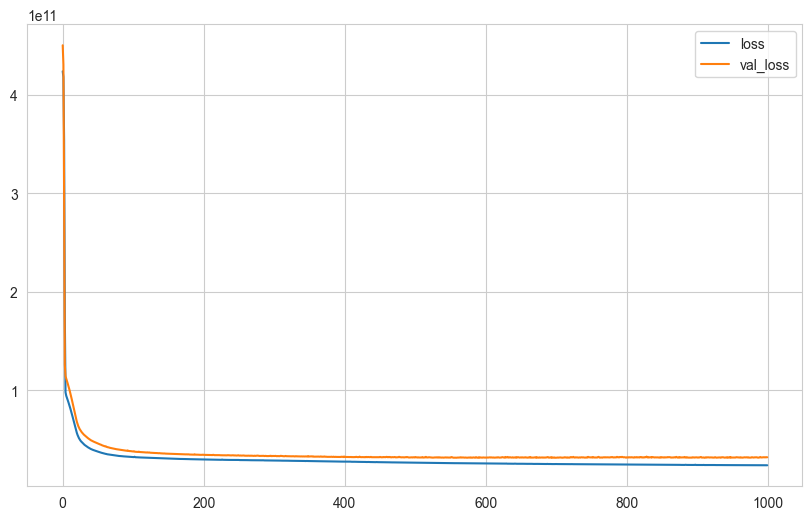

In [41]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot(); # These two curves should be close to each other. 

In [42]:
model.evaluate(X_test, y_test, verbose=0) # Amount of loss in test data

23559135232.0

In [43]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [49]:
eval_metric(y_test, y_pred) 

r2_score: 0.8161885346773721 
mae: 96157.39806495949 
mse: 23559139259.28774 
rmse: 153489.86695963918


**Interpretation:** The R2 of the model is 0.81, which is relatively low. 

# Parameters to Improve the Success of the Model

## Learning_Rate

**Learning rate** is an important hyperparameter in training deep learning models. This parameter determines how fast or slow the model learns.

The learning rate is used to update the model's weights using gradient descent. Gradient descent is an optimization algorithm for updating the model's weights to achieve the minimum value of the loss function. The main objective of gradient descent is to reduce the loss value of the model by taking a step toward the minimum point of the loss function.

The learning rate determines how large or small each weight update step is. The higher the learning rate, the faster the weights are updated and the faster the model learns. However, if the learning rate is too high, the updating of the weights becomes so large that it becomes difficult for the model to find the correct minimum point. The lower the learning rate, the slower the updating of the weights takes place and the slower the model learns. However, if the learning rate is too low, problems can arise, such as the model not learning fast enough and not reaching the minimum point.

The optimal learning rate can vary depending on the data set, the complexity of the model, and the training algorithm. The optimal learning rate provides the optimal rate for the model to minimize the loss value. The determination of the learning rate is checked with the validation set used during training and the hyperparameter is adjusted.

In [74]:
from tensorflow.keras.optimizers import Adam

In [75]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(16, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003) # default learning rate value is 0.001. We can make it 0.002 or 0.003. We use "Adam" as an optimizer. Gredient descent can also be used here. . 
model.compile(optimizer = opt, loss = 'mse')

In [76]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 2s 6ms/step - loss: 424212922368.0000 - val_loss: 451004530688.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 423061323776.0000 - val_loss: 446748164096.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 406068822016.0000 - val_loss: 406805774336.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 325460721664.0000 - val_loss: 275611189248.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 176276733952.0000 - val_loss: 136744255488.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 102013190144.0000 - val_loss: 115628802048.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 95580168192.0000 - val_loss: 113583251456.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 93986357248.0000 - val_loss: 111819227136.0000
Epoch 9/10

130/130 [==============================] - 0s 3ms/step - loss: 37184573440.0000 - val_loss: 45330649088.0000
Epoch 68/1000
130/130 [==============================] - 0s 3ms/step - loss: 37019516928.0000 - val_loss: 45099601920.0000
Epoch 69/1000
130/130 [==============================] - 0s 3ms/step - loss: 36838805504.0000 - val_loss: 44861652992.0000
Epoch 70/1000
130/130 [==============================] - 0s 3ms/step - loss: 36641701888.0000 - val_loss: 44632227840.0000
Epoch 71/1000
130/130 [==============================] - 0s 3ms/step - loss: 36484931584.0000 - val_loss: 44407857152.0000
Epoch 72/1000
130/130 [==============================] - 0s 3ms/step - loss: 36270936064.0000 - val_loss: 44153229312.0000
Epoch 73/1000
130/130 [==============================] - 0s 3ms/step - loss: 36103368704.0000 - val_loss: 43916361728.0000
Epoch 74/1000
130/130 [==============================] - 0s 3ms/step - loss: 35913928704.0000 - val_loss: 43631230976.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 3ms/step - loss: 31759112192.0000 - val_loss: 37378674688.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 31750080512.0000 - val_loss: 37328662528.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 31738638336.0000 - val_loss: 37265215488.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 31670886400.0000 - val_loss: 37211037696.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 31636766720.0000 - val_loss: 37124689920.0000
Epoch 138/1000
130/130 [==============================] - 0s 4ms/step - loss: 31623032832.0000 - val_loss: 37136261120.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 31592548352.0000 - val_loss: 37028069376.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 31539257344.0000 - val_loss: 36975960064.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 30210142208.0000 - val_loss: 35039821824.0000
Epoch 200/1000
130/130 [==============================] - 0s 3ms/step - loss: 30191984640.0000 - val_loss: 35145498624.0000
Epoch 201/1000
130/130 [==============================] - 0s 3ms/step - loss: 30142595072.0000 - val_loss: 34995044352.0000
Epoch 202/1000
130/130 [==============================] - 0s 3ms/step - loss: 30186422272.0000 - val_loss: 34954407936.0000
Epoch 203/1000
130/130 [==============================] - 0s 4ms/step - loss: 30139787264.0000 - val_loss: 34939039744.0000
Epoch 204/1000
130/130 [==============================] - 0s 3ms/step - loss: 30109683712.0000 - val_loss: 34901176320.0000
Epoch 205/1000
130/130 [==============================] - 1s 4ms/step - loss: 30101458944.0000 - val_loss: 34892398592.0000
Epoch 206/1000
130/130 [==============================] - 0s 3ms/step - loss: 30079756288.0000 - val_loss: 34955714560.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 29345204224.0000 - val_loss: 34032175104.0000
Epoch 266/1000
130/130 [==============================] - 0s 3ms/step - loss: 29289500672.0000 - val_loss: 33996042240.0000
Epoch 267/1000
130/130 [==============================] - 0s 3ms/step - loss: 29321162752.0000 - val_loss: 34121934848.0000
Epoch 268/1000
130/130 [==============================] - 0s 3ms/step - loss: 29272877056.0000 - val_loss: 33973805056.0000
Epoch 269/1000
130/130 [==============================] - 0s 3ms/step - loss: 29261891584.0000 - val_loss: 34099578880.0000
Epoch 270/1000
130/130 [==============================] - 0s 3ms/step - loss: 29261541376.0000 - val_loss: 33962467328.0000
Epoch 271/1000
130/130 [==============================] - 0s 3ms/step - loss: 29302415360.0000 - val_loss: 33936277504.0000
Epoch 272/1000
130/130 [==============================] - 0s 3ms/step - loss: 29248761856.0000 - val_loss: 33917417472.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 28810565632.0000 - val_loss: 33570363392.0000
Epoch 332/1000
130/130 [==============================] - 0s 3ms/step - loss: 28758052864.0000 - val_loss: 33498163200.0000
Epoch 333/1000
130/130 [==============================] - 0s 3ms/step - loss: 28761982976.0000 - val_loss: 33583294464.0000
Epoch 334/1000
130/130 [==============================] - 0s 3ms/step - loss: 28852594688.0000 - val_loss: 33486465024.0000
Epoch 335/1000
130/130 [==============================] - 0s 3ms/step - loss: 28750530560.0000 - val_loss: 33496819712.0000
Epoch 336/1000
130/130 [==============================] - 0s 3ms/step - loss: 28759678976.0000 - val_loss: 33500895232.0000
Epoch 337/1000
130/130 [==============================] - 0s 3ms/step - loss: 28721686528.0000 - val_loss: 33430009856.0000
Epoch 338/1000
130/130 [==============================] - 0s 3ms/step - loss: 28746483712.0000 - val_loss: 33417398272.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 28372594688.0000 - val_loss: 33129918464.0000
Epoch 398/1000
130/130 [==============================] - 0s 3ms/step - loss: 28348010496.0000 - val_loss: 33202272256.0000
Epoch 399/1000
130/130 [==============================] - 0s 3ms/step - loss: 28345122816.0000 - val_loss: 32978989056.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 28343767040.0000 - val_loss: 33281902592.0000
Epoch 401/1000
130/130 [==============================] - 0s 3ms/step - loss: 28373121024.0000 - val_loss: 33103837184.0000
Epoch 402/1000
130/130 [==============================] - 0s 3ms/step - loss: 28317667328.0000 - val_loss: 33029388288.0000
Epoch 403/1000
130/130 [==============================] - 0s 3ms/step - loss: 28312487936.0000 - val_loss: 33002731520.0000
Epoch 404/1000
130/130 [==============================] - 0s 3ms/step - loss: 28338634752.0000 - val_loss: 33037963264.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 28001363968.0000 - val_loss: 32859305984.0000
Epoch 464/1000
130/130 [==============================] - 0s 3ms/step - loss: 27981971456.0000 - val_loss: 32638543872.0000
Epoch 465/1000
130/130 [==============================] - 0s 3ms/step - loss: 27964762112.0000 - val_loss: 32876638208.0000
Epoch 466/1000
130/130 [==============================] - 0s 3ms/step - loss: 27968083968.0000 - val_loss: 32628561920.0000
Epoch 467/1000
130/130 [==============================] - 0s 3ms/step - loss: 27958065152.0000 - val_loss: 32581873664.0000
Epoch 468/1000
130/130 [==============================] - 0s 3ms/step - loss: 27944048640.0000 - val_loss: 32761450496.0000
Epoch 469/1000
130/130 [==============================] - 0s 3ms/step - loss: 27965923328.0000 - val_loss: 32678979584.0000
Epoch 470/1000
130/130 [==============================] - 1s 4ms/step - loss: 27940603904.0000 - val_loss: 32637253632.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 27519492096.0000 - val_loss: 32320423936.0000
Epoch 530/1000
130/130 [==============================] - 0s 3ms/step - loss: 27538937856.0000 - val_loss: 32244103168.0000
Epoch 531/1000
130/130 [==============================] - 0s 3ms/step - loss: 27545821184.0000 - val_loss: 32337799168.0000
Epoch 532/1000
130/130 [==============================] - 0s 3ms/step - loss: 27530973184.0000 - val_loss: 32200388608.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 27514218496.0000 - val_loss: 32417744896.0000
Epoch 534/1000
130/130 [==============================] - 0s 3ms/step - loss: 27526823936.0000 - val_loss: 32193527808.0000
Epoch 535/1000
130/130 [==============================] - 0s 3ms/step - loss: 27473496064.0000 - val_loss: 32423954432.0000
Epoch 536/1000
130/130 [==============================] - 0s 3ms/step - loss: 27502172160.0000 - val_loss: 32183259136.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 27053740032.0000 - val_loss: 31691153408.0000
Epoch 596/1000
130/130 [==============================] - 0s 3ms/step - loss: 27036995584.0000 - val_loss: 31660724224.0000
Epoch 597/1000
130/130 [==============================] - 0s 3ms/step - loss: 27018536960.0000 - val_loss: 31817875456.0000
Epoch 598/1000
130/130 [==============================] - 0s 3ms/step - loss: 27033344000.0000 - val_loss: 31777605632.0000
Epoch 599/1000
130/130 [==============================] - 0s 3ms/step - loss: 27027869696.0000 - val_loss: 31732213760.0000
Epoch 600/1000
130/130 [==============================] - 0s 3ms/step - loss: 26992017408.0000 - val_loss: 31659345920.0000
Epoch 601/1000
130/130 [==============================] - 0s 3ms/step - loss: 27077664768.0000 - val_loss: 31610810368.0000
Epoch 602/1000
130/130 [==============================] - 0s 3ms/step - loss: 27018852352.0000 - val_loss: 31590268928.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 26464743424.0000 - val_loss: 31112921088.0000
Epoch 662/1000
130/130 [==============================] - 0s 3ms/step - loss: 26444673024.0000 - val_loss: 31273318400.0000
Epoch 663/1000
130/130 [==============================] - 0s 3ms/step - loss: 26464720896.0000 - val_loss: 31161047040.0000
Epoch 664/1000
130/130 [==============================] - 0s 3ms/step - loss: 26408570880.0000 - val_loss: 31547160576.0000
Epoch 665/1000
130/130 [==============================] - 0s 3ms/step - loss: 26474201088.0000 - val_loss: 31066165248.0000
Epoch 666/1000
130/130 [==============================] - 0s 3ms/step - loss: 26449993728.0000 - val_loss: 31030999040.0000
Epoch 667/1000
130/130 [==============================] - 0s 3ms/step - loss: 26402332672.0000 - val_loss: 31010371584.0000
Epoch 668/1000
130/130 [==============================] - 0s 3ms/step - loss: 26420750336.0000 - val_loss: 31015974912.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 25876518912.0000 - val_loss: 30594349056.0000
Epoch 728/1000
130/130 [==============================] - 0s 3ms/step - loss: 25875488768.0000 - val_loss: 30707224576.0000
Epoch 729/1000
130/130 [==============================] - 0s 3ms/step - loss: 25853347840.0000 - val_loss: 30635884544.0000
Epoch 730/1000
130/130 [==============================] - 0s 3ms/step - loss: 25890316288.0000 - val_loss: 30671116288.0000
Epoch 731/1000
130/130 [==============================] - 0s 3ms/step - loss: 25869742080.0000 - val_loss: 30681348096.0000
Epoch 732/1000
130/130 [==============================] - 0s 3ms/step - loss: 25859465216.0000 - val_loss: 30534893568.0000
Epoch 733/1000
130/130 [==============================] - 1s 4ms/step - loss: 25786243072.0000 - val_loss: 30568179712.0000
Epoch 734/1000
130/130 [==============================] - 0s 3ms/step - loss: 25804300288.0000 - val_loss: 30678972416.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 25277812736.0000 - val_loss: 30264832000.0000
Epoch 794/1000
130/130 [==============================] - 0s 3ms/step - loss: 25246443520.0000 - val_loss: 30498009088.0000
Epoch 795/1000
130/130 [==============================] - 0s 3ms/step - loss: 25283977216.0000 - val_loss: 30408720384.0000
Epoch 796/1000
130/130 [==============================] - 1s 4ms/step - loss: 25216768000.0000 - val_loss: 30212046848.0000
Epoch 797/1000
130/130 [==============================] - 0s 3ms/step - loss: 25207121920.0000 - val_loss: 30263375872.0000
Epoch 798/1000
130/130 [==============================] - 0s 3ms/step - loss: 25200207872.0000 - val_loss: 30218348544.0000
Epoch 799/1000
130/130 [==============================] - 0s 3ms/step - loss: 25243101184.0000 - val_loss: 30106441728.0000
Epoch 800/1000
130/130 [==============================] - 0s 3ms/step - loss: 25206540288.0000 - val_loss: 30012663808.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 24753475584.0000 - val_loss: 30395183104.0000
Epoch 860/1000
130/130 [==============================] - 0s 3ms/step - loss: 24734472192.0000 - val_loss: 30377156608.0000
Epoch 861/1000
130/130 [==============================] - 0s 3ms/step - loss: 24746547200.0000 - val_loss: 30303946752.0000
Epoch 862/1000
130/130 [==============================] - 0s 4ms/step - loss: 24728649728.0000 - val_loss: 30395822080.0000
Epoch 863/1000
130/130 [==============================] - 0s 3ms/step - loss: 24752539648.0000 - val_loss: 30270361600.0000
Epoch 864/1000
130/130 [==============================] - 0s 3ms/step - loss: 24730673152.0000 - val_loss: 30217676800.0000
Epoch 865/1000
130/130 [==============================] - 0s 3ms/step - loss: 24695695360.0000 - val_loss: 30299922432.0000
Epoch 866/1000
130/130 [==============================] - 0s 3ms/step - loss: 24694636544.0000 - val_loss: 30183233536.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 24315166720.0000 - val_loss: 30537773056.0000
Epoch 926/1000
130/130 [==============================] - 0s 3ms/step - loss: 24287993856.0000 - val_loss: 30726062080.0000
Epoch 927/1000
130/130 [==============================] - 0s 3ms/step - loss: 24297678848.0000 - val_loss: 30504957952.0000
Epoch 928/1000
130/130 [==============================] - 0s 3ms/step - loss: 24279687168.0000 - val_loss: 30490726400.0000
Epoch 929/1000
130/130 [==============================] - 0s 3ms/step - loss: 24306450432.0000 - val_loss: 30500147200.0000
Epoch 930/1000
130/130 [==============================] - 0s 3ms/step - loss: 24279019520.0000 - val_loss: 30507925504.0000
Epoch 931/1000
130/130 [==============================] - 0s 3ms/step - loss: 24319322112.0000 - val_loss: 30585090048.0000
Epoch 932/1000
130/130 [==============================] - 0s 3ms/step - loss: 24275066880.0000 - val_loss: 30680901632.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 24034451456.0000 - val_loss: 31035197440.0000
Epoch 992/1000
130/130 [==============================] - 0s 4ms/step - loss: 23990536192.0000 - val_loss: 30944403456.0000
Epoch 993/1000
130/130 [==============================] - 0s 3ms/step - loss: 23979808768.0000 - val_loss: 30995800064.0000
Epoch 994/1000
130/130 [==============================] - 0s 4ms/step - loss: 23996235776.0000 - val_loss: 30968606720.0000
Epoch 995/1000
130/130 [==============================] - 0s 3ms/step - loss: 23964766208.0000 - val_loss: 31069749248.0000
Epoch 996/1000
130/130 [==============================] - 0s 3ms/step - loss: 24003678208.0000 - val_loss: 31106572288.0000
Epoch 997/1000
130/130 [==============================] - 0s 3ms/step - loss: 23986227200.0000 - val_loss: 31163729920.0000
Epoch 998/1000
130/130 [==============================] - 0s 3ms/step - loss: 23968100352.0000 - val_loss: 31041779712.0000
Epoch 999/1000
130/130 

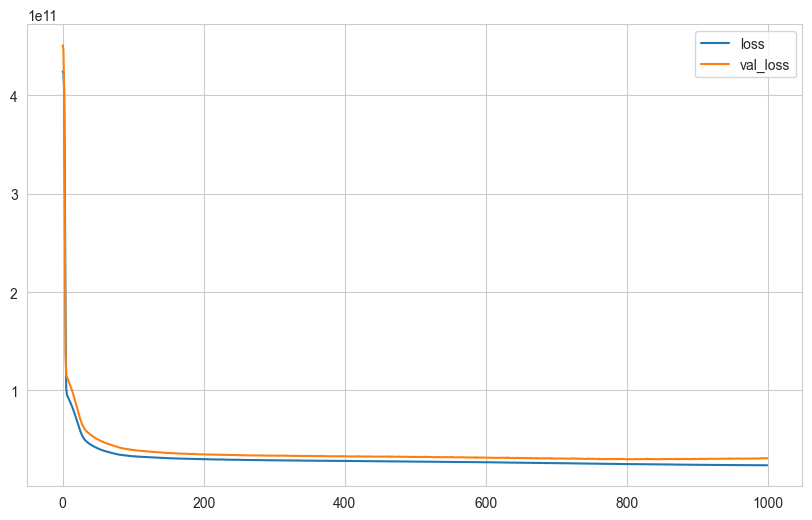

In [77]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [78]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [79]:
eval_metric(y_test, y_pred)

r2_score: 0.8109553522468679 
mae: 97328.35711805556 
mse: 24229876927.545307 
rmse: 155659.4903227725


**Interpretation:** The R2 of the model was not changed. 

### EarlyStopping

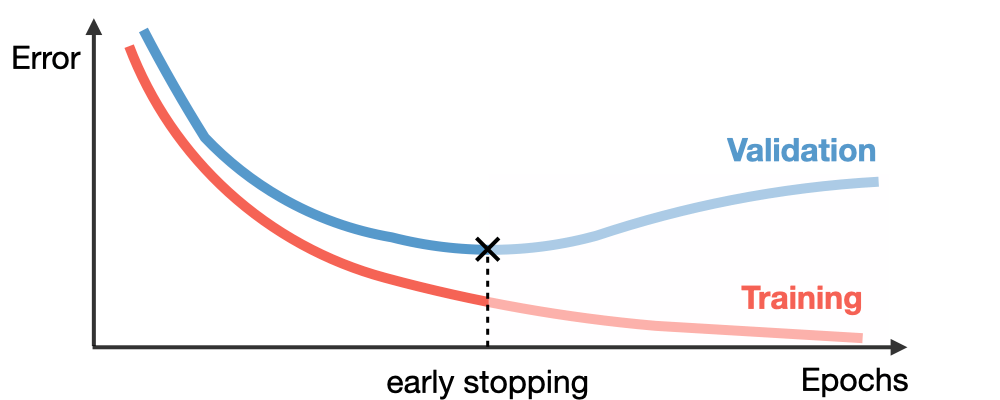

**Early stopping** is a technique used to prevent overfitting in deep learning models. This technique reduces the risk of overfitting by removing the model from training at a certain point during training.

Early stopping is performed by examining the validation loss values that occur during training to prevent the model from overfitting. During training, the loss value of the model on the validation set is calculated at the end of each epoch. These values record the lowest loss value before a "burst" occurs.

A burst is a point at which the model overfits in an overlearning situation and the validation loss increases. The early stopping technique terminates training after the burst, assuming that the model cannot perform better.

Early stopping can help prevent model overfitting while at the same time-saving time and processing power resources. However, the use of early stopping should be implemented correctly and an optimal number of epochs should be chosen. Otherwise, problems may arise, such as the model not getting enough training or training ending early.

In [62]:
from tensorflow.keras.callbacks import EarlyStopping

In [63]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(16, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003) # Increasing lr may improve scores.
model.compile(optimizer = opt, loss = 'mse')

In [64]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25) # "patience=25" mean; wait for 25 epochs, and if you don't get a better score than that, stop.  
# patiance is usually 15, 20, 25.
# mode = "auto" mean; the lower the loss value, the better for us.

In [65]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 2s 6ms/step - loss: 424187265024.0000 - val_loss: 450842001408.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 420996055040.0000 - val_loss: 439837949952.0000
Epoch 3/1000
130/130 [==============================] - 1s 5ms/step - loss: 382972723200.0000 - val_loss: 357253054464.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 246136487936.0000 - val_loss: 177111695360.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 114520940544.0000 - val_loss: 116696662016.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 96099647488.0000 - val_loss: 113973780480.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 94173741056.0000 - val_loss: 111861186560.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 92241920000.0000 - val_loss: 109605429248.0000
Epoch 9/100

130/130 [==============================] - 0s 3ms/step - loss: 34653593600.0000 - val_loss: 41822244864.0000
Epoch 68/1000
130/130 [==============================] - 0s 3ms/step - loss: 34537938944.0000 - val_loss: 41615269888.0000
Epoch 69/1000
130/130 [==============================] - 0s 3ms/step - loss: 34419777536.0000 - val_loss: 41423319040.0000
Epoch 70/1000
130/130 [==============================] - 0s 3ms/step - loss: 34284079104.0000 - val_loss: 41252696064.0000
Epoch 71/1000
130/130 [==============================] - 0s 3ms/step - loss: 34189795328.0000 - val_loss: 41195851776.0000
Epoch 72/1000
130/130 [==============================] - 0s 3ms/step - loss: 34054193152.0000 - val_loss: 40969424896.0000
Epoch 73/1000
130/130 [==============================] - 0s 3ms/step - loss: 33960810496.0000 - val_loss: 40780308480.0000
Epoch 74/1000
130/130 [==============================] - 0s 3ms/step - loss: 33868881920.0000 - val_loss: 40597524480.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 3ms/step - loss: 30867329024.0000 - val_loss: 36072476672.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 30868350976.0000 - val_loss: 36014354432.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 30873194496.0000 - val_loss: 35980570624.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 30801162240.0000 - val_loss: 35887427584.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 30777305088.0000 - val_loss: 35813523456.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 30768431104.0000 - val_loss: 35875889152.0000
Epoch 139/1000
130/130 [==============================] - 1s 4ms/step - loss: 30739527680.0000 - val_loss: 35768029184.0000
Epoch 140/1000
130/130 [==============================] - 0s 4ms/step - loss: 30700146688.0000 - val_loss: 35720663040.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 28693788672.0000 - val_loss: 33291784192.0000
Epoch 200/1000
130/130 [==============================] - 0s 3ms/step - loss: 28640129024.0000 - val_loss: 33286617088.0000
Epoch 201/1000
130/130 [==============================] - 0s 3ms/step - loss: 28572096512.0000 - val_loss: 33191204864.0000
Epoch 202/1000
130/130 [==============================] - 0s 3ms/step - loss: 28612067328.0000 - val_loss: 33246935040.0000
Epoch 203/1000
130/130 [==============================] - 0s 3ms/step - loss: 28543143936.0000 - val_loss: 33119660032.0000
Epoch 204/1000
130/130 [==============================] - 0s 3ms/step - loss: 28478932992.0000 - val_loss: 33094942720.0000
Epoch 205/1000
130/130 [==============================] - 0s 3ms/step - loss: 28466063360.0000 - val_loss: 33070182400.0000
Epoch 206/1000
130/130 [==============================] - 0s 3ms/step - loss: 28396001280.0000 - val_loss: 33053880320.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 26115989504.0000 - val_loss: 30355480576.0000
Epoch 266/1000
130/130 [==============================] - 0s 3ms/step - loss: 26003558400.0000 - val_loss: 30191439872.0000
Epoch 267/1000
130/130 [==============================] - 0s 3ms/step - loss: 25995565056.0000 - val_loss: 30182182912.0000
Epoch 268/1000
130/130 [==============================] - 0s 3ms/step - loss: 25893122048.0000 - val_loss: 30149011456.0000
Epoch 269/1000
130/130 [==============================] - 0s 3ms/step - loss: 25874016256.0000 - val_loss: 30154563584.0000
Epoch 270/1000
130/130 [==============================] - 0s 3ms/step - loss: 25810984960.0000 - val_loss: 30047817728.0000
Epoch 271/1000
130/130 [==============================] - 0s 4ms/step - loss: 25816653824.0000 - val_loss: 29997477888.0000
Epoch 272/1000
130/130 [==============================] - 0s 3ms/step - loss: 25712269312.0000 - val_loss: 29945796608.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 22871236608.0000 - val_loss: 26963679232.0000
Epoch 332/1000
130/130 [==============================] - 0s 3ms/step - loss: 22745444352.0000 - val_loss: 26865043456.0000
Epoch 333/1000
130/130 [==============================] - 0s 3ms/step - loss: 22733154304.0000 - val_loss: 26869061632.0000
Epoch 334/1000
130/130 [==============================] - 0s 3ms/step - loss: 22921443328.0000 - val_loss: 26640680960.0000
Epoch 335/1000
130/130 [==============================] - 0s 3ms/step - loss: 22601234432.0000 - val_loss: 26637305856.0000
Epoch 336/1000
130/130 [==============================] - 0s 3ms/step - loss: 22612039680.0000 - val_loss: 26616078336.0000
Epoch 337/1000
130/130 [==============================] - 0s 3ms/step - loss: 22519549952.0000 - val_loss: 26531837952.0000
Epoch 338/1000
130/130 [==============================] - 0s 4ms/step - loss: 22523938816.0000 - val_loss: 26499598336.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 20425054208.0000 - val_loss: 24331732992.0000
Epoch 398/1000
130/130 [==============================] - 0s 3ms/step - loss: 20375984128.0000 - val_loss: 24441780224.0000
Epoch 399/1000
130/130 [==============================] - 0s 3ms/step - loss: 20373448704.0000 - val_loss: 24253689856.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 20324945920.0000 - val_loss: 24502214656.0000
Epoch 401/1000
130/130 [==============================] - 0s 3ms/step - loss: 20318687232.0000 - val_loss: 24275677184.0000
Epoch 402/1000
130/130 [==============================] - 0s 4ms/step - loss: 20229969920.0000 - val_loss: 24282189824.0000
Epoch 403/1000
130/130 [==============================] - 0s 3ms/step - loss: 20247937024.0000 - val_loss: 24213454848.0000
Epoch 404/1000
130/130 [==============================] - 1s 4ms/step - loss: 20223172608.0000 - val_loss: 24179933184.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 19142342656.0000 - val_loss: 23082123264.0000
Epoch 464/1000
130/130 [==============================] - 0s 3ms/step - loss: 19104985088.0000 - val_loss: 22983565312.0000
Epoch 465/1000
130/130 [==============================] - 0s 3ms/step - loss: 19015639040.0000 - val_loss: 23349790720.0000
Epoch 466/1000
130/130 [==============================] - 0s 3ms/step - loss: 19034863616.0000 - val_loss: 22989613056.0000
Epoch 467/1000
130/130 [==============================] - 0s 3ms/step - loss: 19006162944.0000 - val_loss: 22944583680.0000
Epoch 468/1000
130/130 [==============================] - 0s 3ms/step - loss: 18981994496.0000 - val_loss: 22919559168.0000
Epoch 469/1000
130/130 [==============================] - 0s 3ms/step - loss: 19032832000.0000 - val_loss: 22970161152.0000
Epoch 470/1000
130/130 [==============================] - 0s 3ms/step - loss: 19006656512.0000 - val_loss: 23104940032.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 18267541504.0000 - val_loss: 22526507008.0000
Epoch 530/1000
130/130 [==============================] - 0s 3ms/step - loss: 18303041536.0000 - val_loss: 22461231104.0000
Epoch 531/1000
130/130 [==============================] - 0s 3ms/step - loss: 18359377920.0000 - val_loss: 22537474048.0000
Epoch 532/1000
130/130 [==============================] - 0s 3ms/step - loss: 18281379840.0000 - val_loss: 22514663424.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 18351079424.0000 - val_loss: 22383726592.0000
Epoch 534/1000
130/130 [==============================] - 0s 3ms/step - loss: 18331447296.0000 - val_loss: 22347161600.0000
Epoch 535/1000
130/130 [==============================] - 0s 4ms/step - loss: 18241730560.0000 - val_loss: 22512228352.0000
Epoch 536/1000
130/130 [==============================] - 0s 3ms/step - loss: 18268436480.0000 - val_loss: 22429241344.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 17625765888.0000 - val_loss: 22364864512.0000
Epoch 596/1000
130/130 [==============================] - 0s 3ms/step - loss: 17676075008.0000 - val_loss: 22227793920.0000
Epoch 597/1000
130/130 [==============================] - 0s 3ms/step - loss: 17607657472.0000 - val_loss: 22308751360.0000
Epoch 598/1000
130/130 [==============================] - 0s 3ms/step - loss: 17635555328.0000 - val_loss: 22229702656.0000
Epoch 599/1000
130/130 [==============================] - 0s 3ms/step - loss: 17730703360.0000 - val_loss: 22343823360.0000
Epoch 600/1000
130/130 [==============================] - 0s 3ms/step - loss: 17587359744.0000 - val_loss: 22346022912.0000
Epoch 601/1000
130/130 [==============================] - 0s 3ms/step - loss: 17657782272.0000 - val_loss: 22536990720.0000
Epoch 602/1000
130/130 [==============================] - 0s 3ms/step - loss: 17614694400.0000 - val_loss: 22369931264.0000
Epoch 603/1000
130/130 

<AxesSubplot:>

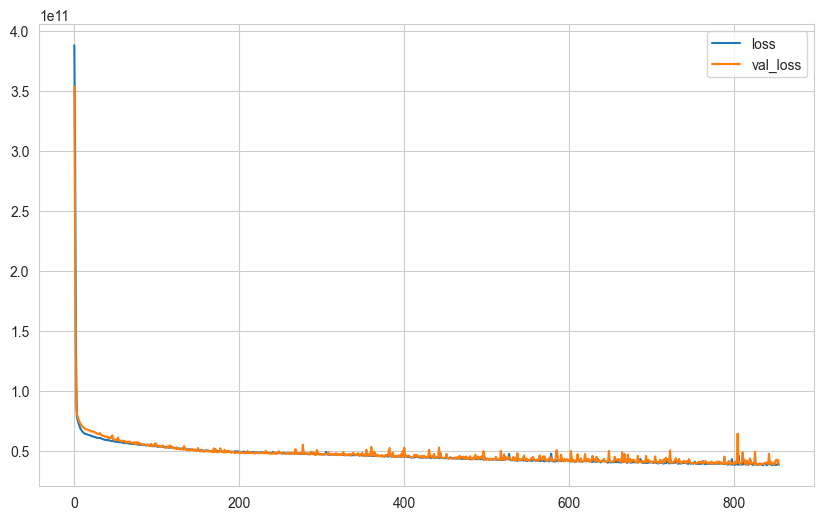

In [110]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot(); 

In [66]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [67]:
eval_metric(y_test, y_pred) # to see the scores

r2_score: 0.8466059942633152 
mae: 80601.18646556712 
mse: 19660529534.14796 
rmse: 140216.01026326473


**Interpretation:** The R2 of the model was increased 0.82 to 0.84. 

### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [68]:
from tensorflow.keras.layers import Dropout

In [69]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dropout(0.2)) # It means, "Drop out 20 percent of the neurons" (to zero their weights). 
model.add(Dense(29, activation = 'relu'))
model.add(Dropout(0.2)) # It is not necessary to do this on every layer. 
model.add(Dense(15, activation = 'relu'))
model.add(Dropout(0.2)) # 
model.add(Dense(8, activation = 'relu'))
model.add(Dropout(0.2)) #  We do this for better learning. 
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [70]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [71]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 3s 6ms/step - loss: 424170291200.0000 - val_loss: 450738978816.0000
Epoch 2/1000
130/130 [==============================] - 0s 4ms/step - loss: 419217244160.0000 - val_loss: 433071161344.0000
Epoch 3/1000
130/130 [==============================] - 0s 4ms/step - loss: 356309860352.0000 - val_loss: 296628649984.0000
Epoch 4/1000
130/130 [==============================] - 0s 4ms/step - loss: 185084182528.0000 - val_loss: 128452157440.0000
Epoch 5/1000
130/130 [==============================] - 1s 4ms/step - loss: 126040432640.0000 - val_loss: 118282838016.0000
Epoch 6/1000
130/130 [==============================] - 1s 4ms/step - loss: 122178355200.0000 - val_loss: 115527794688.0000
Epoch 7/1000
130/130 [==============================] - 0s 4ms/step - loss: 119851032576.0000 - val_loss: 113092599808.0000
Epoch 8/1000
130/130 [==============================] - 1s 4ms/step - loss: 118754492416.0000 - val_loss: 110681481216.0000
Epoch 9/

130/130 [==============================] - 0s 4ms/step - loss: 69602172928.0000 - val_loss: 48014909440.0000
Epoch 68/1000
130/130 [==============================] - 1s 4ms/step - loss: 67134042112.0000 - val_loss: 47489503232.0000
Epoch 69/1000
130/130 [==============================] - 0s 4ms/step - loss: 68617007104.0000 - val_loss: 48225230848.0000
Epoch 70/1000
130/130 [==============================] - 0s 4ms/step - loss: 68504563712.0000 - val_loss: 47704010752.0000
Epoch 71/1000
130/130 [==============================] - 0s 4ms/step - loss: 66784358400.0000 - val_loss: 47665856512.0000
Epoch 72/1000
130/130 [==============================] - 0s 4ms/step - loss: 68777558016.0000 - val_loss: 46665670656.0000
Epoch 73/1000
130/130 [==============================] - 0s 4ms/step - loss: 67906666496.0000 - val_loss: 47975940096.0000
Epoch 74/1000
130/130 [==============================] - 0s 4ms/step - loss: 69788483584.0000 - val_loss: 46398705664.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 1s 4ms/step - loss: 63439630336.0000 - val_loss: 40726605824.0000
Epoch 134/1000
130/130 [==============================] - 1s 4ms/step - loss: 66223120384.0000 - val_loss: 41244454912.0000
Epoch 135/1000
130/130 [==============================] - 1s 4ms/step - loss: 65422114816.0000 - val_loss: 41221640192.0000
Epoch 136/1000
130/130 [==============================] - 0s 4ms/step - loss: 64008011776.0000 - val_loss: 40607477760.0000
Epoch 137/1000
130/130 [==============================] - 1s 4ms/step - loss: 64223707136.0000 - val_loss: 41653198848.0000
Epoch 138/1000
130/130 [==============================] - 0s 4ms/step - loss: 65110036480.0000 - val_loss: 40605495296.0000
Epoch 139/1000
130/130 [==============================] - 1s 4ms/step - loss: 67364847616.0000 - val_loss: 40709881856.0000
Epoch 140/1000
130/130 [==============================] - 1s 4ms/step - loss: 68190064640.0000 - val_loss: 40320204800.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 1s 4ms/step - loss: 66597220352.0000 - val_loss: 39016931328.0000
Epoch 200/1000
130/130 [==============================] - 1s 5ms/step - loss: 64447885312.0000 - val_loss: 37680205824.0000
Epoch 201/1000
130/130 [==============================] - 1s 4ms/step - loss: 62910234624.0000 - val_loss: 38461640704.0000
Epoch 202/1000
130/130 [==============================] - 0s 4ms/step - loss: 62743969792.0000 - val_loss: 38538395648.0000
Epoch 203/1000
130/130 [==============================] - 1s 4ms/step - loss: 63740248064.0000 - val_loss: 38533394432.0000
Epoch 204/1000
130/130 [==============================] - 1s 4ms/step - loss: 62739238912.0000 - val_loss: 38261420032.0000
Epoch 205/1000
130/130 [==============================] - 1s 4ms/step - loss: 64078721024.0000 - val_loss: 38592253952.0000
Epoch 206/1000
130/130 [==============================] - 1s 4ms/step - loss: 63751876608.0000 - val_loss: 37828980736.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 4ms/step - loss: 60051075072.0000 - val_loss: 36872400896.0000
Epoch 266/1000
130/130 [==============================] - 0s 4ms/step - loss: 61289889792.0000 - val_loss: 38055002112.0000
Epoch 267/1000
130/130 [==============================] - 0s 4ms/step - loss: 63790485504.0000 - val_loss: 36965150720.0000
Epoch 268/1000
130/130 [==============================] - 1s 4ms/step - loss: 61363781632.0000 - val_loss: 37011755008.0000
Epoch 269/1000
130/130 [==============================] - 0s 4ms/step - loss: 62629199872.0000 - val_loss: 36238995456.0000
Epoch 270/1000
130/130 [==============================] - 0s 4ms/step - loss: 60707229696.0000 - val_loss: 37061943296.0000
Epoch 271/1000
130/130 [==============================] - 0s 4ms/step - loss: 61582966784.0000 - val_loss: 37567762432.0000
Epoch 272/1000
130/130 [==============================] - 0s 4ms/step - loss: 61759688704.0000 - val_loss: 37071781888.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 1s 4ms/step - loss: 62084911104.0000 - val_loss: 35685490688.0000
Epoch 332/1000
130/130 [==============================] - 1s 4ms/step - loss: 58968788992.0000 - val_loss: 35643326464.0000
Epoch 333/1000
130/130 [==============================] - 1s 4ms/step - loss: 60871401472.0000 - val_loss: 35282526208.0000
Epoch 334/1000
130/130 [==============================] - 0s 4ms/step - loss: 61769084928.0000 - val_loss: 35975061504.0000
Epoch 335/1000
130/130 [==============================] - 0s 4ms/step - loss: 61914238976.0000 - val_loss: 36637347840.0000
Epoch 336/1000
130/130 [==============================] - 0s 4ms/step - loss: 62888214528.0000 - val_loss: 36179042304.0000
Epoch 337/1000
130/130 [==============================] - 0s 4ms/step - loss: 60827009024.0000 - val_loss: 36284624896.0000
Epoch 338/1000
130/130 [==============================] - 0s 4ms/step - loss: 60320411648.0000 - val_loss: 36507250688.0000
Epoch 339/1000
130/130 

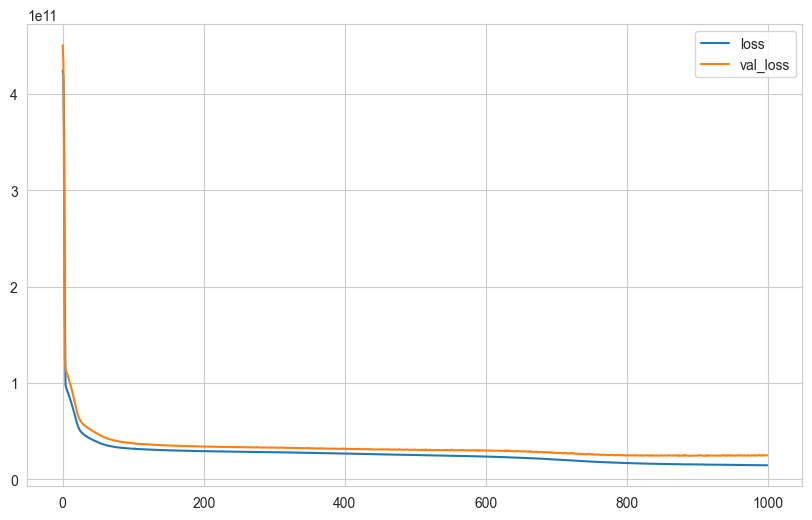

In [53]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [54]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [55]:
eval_metric(y_test, y_pred) 

r2_score: 0.8319372601713425 
mae: 79579.6908239294 
mse: 21540623077.952072 
rmse: 146767.2411607988


**Interpretation:** The R2 of the model was increased 0.83 to 0.87. 

## Saving Final Model and Scaler

In [97]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

In [98]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [99]:
#early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [100]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1000,
         # callbacks = [early_stop]
         )

Epoch 1/1000
152/152 [==============================] - 1s 5ms/step - loss: 426416144384.0000 - val_loss: 406002565120.0000
Epoch 2/1000
152/152 [==============================] - 1s 3ms/step - loss: 274798018560.0000 - val_loss: 94608293888.0000
Epoch 3/1000
152/152 [==============================] - 1s 4ms/step - loss: 97477058560.0000 - val_loss: 88555741184.0000
Epoch 4/1000
152/152 [==============================] - 0s 3ms/step - loss: 92657041408.0000 - val_loss: 83812974592.0000
Epoch 5/1000
152/152 [==============================] - 0s 3ms/step - loss: 87678459904.0000 - val_loss: 78632173568.0000
Epoch 6/1000
152/152 [==============================] - 0s 3ms/step - loss: 82362630144.0000 - val_loss: 73219350528.0000
Epoch 7/1000
152/152 [==============================] - 0s 3ms/step - loss: 76469280768.0000 - val_loss: 67131924480.0000
Epoch 8/1000
152/152 [==============================] - 0s 3ms/step - loss: 70028427264.0000 - val_loss: 60857552896.0000
Epoch 9/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 28927721472.0000 - val_loss: 24912111616.0000
Epoch 134/1000
152/152 [==============================] - 0s 2ms/step - loss: 28812468224.0000 - val_loss: 24947718144.0000
Epoch 135/1000
152/152 [==============================] - 0s 2ms/step - loss: 28880648192.0000 - val_loss: 24947027968.0000
Epoch 136/1000
152/152 [==============================] - 0s 2ms/step - loss: 28749557760.0000 - val_loss: 25097678848.0000
Epoch 137/1000
152/152 [==============================] - 0s 3ms/step - loss: 28864739328.0000 - val_loss: 24888606720.0000
Epoch 138/1000
152/152 [==============================] - 0s 3ms/step - loss: 28752973824.0000 - val_loss: 24842823680.0000
Epoch 139/1000
152/152 [==============================] - 0s 3ms/step - loss: 28675082240.0000 - val_loss: 24737318912.0000
Epoch 140/1000
152/152 [==============================] - 0s 2ms/step - loss: 28714737664.0000 - val_loss: 24678279168.0000
Epoch 141/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 25881380864.0000 - val_loss: 22889529344.0000
Epoch 266/1000
152/152 [==============================] - 0s 2ms/step - loss: 25894111232.0000 - val_loss: 23064004608.0000
Epoch 267/1000
152/152 [==============================] - 0s 2ms/step - loss: 25931126784.0000 - val_loss: 22950772736.0000
Epoch 268/1000
152/152 [==============================] - 0s 2ms/step - loss: 25932765184.0000 - val_loss: 22942750720.0000
Epoch 269/1000
152/152 [==============================] - 0s 3ms/step - loss: 25958578176.0000 - val_loss: 22895339520.0000
Epoch 270/1000
152/152 [==============================] - 0s 2ms/step - loss: 25852147712.0000 - val_loss: 22949769216.0000
Epoch 271/1000
152/152 [==============================] - 0s 2ms/step - loss: 25899788288.0000 - val_loss: 22958223360.0000
Epoch 272/1000
152/152 [==============================] - 0s 2ms/step - loss: 25799514112.0000 - val_loss: 23546130432.0000
Epoch 273/1000
152/152 

152/152 [==============================] - 0s 3ms/step - loss: 24803002368.0000 - val_loss: 22638589952.0000
Epoch 398/1000
152/152 [==============================] - 0s 2ms/step - loss: 24736591872.0000 - val_loss: 22636865536.0000
Epoch 399/1000
152/152 [==============================] - 0s 2ms/step - loss: 24761229312.0000 - val_loss: 22507270144.0000
Epoch 400/1000
152/152 [==============================] - 0s 2ms/step - loss: 24704731136.0000 - val_loss: 22592618496.0000
Epoch 401/1000
152/152 [==============================] - 0s 2ms/step - loss: 24687296512.0000 - val_loss: 22622169088.0000
Epoch 402/1000
152/152 [==============================] - 0s 3ms/step - loss: 24755511296.0000 - val_loss: 22798473216.0000
Epoch 403/1000
152/152 [==============================] - 0s 2ms/step - loss: 24722432000.0000 - val_loss: 22602072064.0000
Epoch 404/1000
152/152 [==============================] - 0s 2ms/step - loss: 24665374720.0000 - val_loss: 22556856320.0000
Epoch 405/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 24097503232.0000 - val_loss: 22284265472.0000
Epoch 530/1000
152/152 [==============================] - 0s 2ms/step - loss: 24169140224.0000 - val_loss: 22235406336.0000
Epoch 531/1000
152/152 [==============================] - 0s 2ms/step - loss: 24120176640.0000 - val_loss: 22201243648.0000
Epoch 532/1000
152/152 [==============================] - 0s 2ms/step - loss: 24070508544.0000 - val_loss: 22285221888.0000
Epoch 533/1000
152/152 [==============================] - 0s 2ms/step - loss: 24032651264.0000 - val_loss: 22323953664.0000
Epoch 534/1000
152/152 [==============================] - 0s 2ms/step - loss: 24079554560.0000 - val_loss: 22232696832.0000
Epoch 535/1000
152/152 [==============================] - 0s 2ms/step - loss: 24067014656.0000 - val_loss: 22511513600.0000
Epoch 536/1000
152/152 [==============================] - 0s 3ms/step - loss: 24115009536.0000 - val_loss: 22398760960.0000
Epoch 537/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 18151282688.0000 - val_loss: 17569398784.0000
Epoch 662/1000
152/152 [==============================] - 0s 2ms/step - loss: 18105331712.0000 - val_loss: 17475987456.0000
Epoch 663/1000
152/152 [==============================] - 0s 2ms/step - loss: 17946591232.0000 - val_loss: 17378062336.0000
Epoch 664/1000
152/152 [==============================] - 0s 2ms/step - loss: 17982081024.0000 - val_loss: 17461608448.0000
Epoch 665/1000
152/152 [==============================] - 0s 2ms/step - loss: 17871214592.0000 - val_loss: 17419008000.0000
Epoch 666/1000
152/152 [==============================] - 0s 2ms/step - loss: 17853212672.0000 - val_loss: 17418463232.0000
Epoch 667/1000
152/152 [==============================] - 0s 2ms/step - loss: 17757962240.0000 - val_loss: 17470248960.0000
Epoch 668/1000
152/152 [==============================] - 0s 2ms/step - loss: 17736382464.0000 - val_loss: 17365356544.0000
Epoch 669/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 14572355584.0000 - val_loss: 15432450048.0000
Epoch 794/1000
152/152 [==============================] - 0s 2ms/step - loss: 14535964672.0000 - val_loss: 15360856064.0000
Epoch 795/1000
152/152 [==============================] - 0s 2ms/step - loss: 14509825024.0000 - val_loss: 15368813568.0000
Epoch 796/1000
152/152 [==============================] - 0s 2ms/step - loss: 14582230016.0000 - val_loss: 15433838592.0000
Epoch 797/1000
152/152 [==============================] - 0s 2ms/step - loss: 14569023488.0000 - val_loss: 15391724544.0000
Epoch 798/1000
152/152 [==============================] - 0s 2ms/step - loss: 14545486848.0000 - val_loss: 15571627008.0000
Epoch 799/1000
152/152 [==============================] - 0s 2ms/step - loss: 14505000960.0000 - val_loss: 15320726528.0000
Epoch 800/1000
152/152 [==============================] - 0s 2ms/step - loss: 14381594624.0000 - val_loss: 15118098432.0000
Epoch 801/1000
152/152 

152/152 [==============================] - 0s 3ms/step - loss: 12600113152.0000 - val_loss: 13955422208.0000
Epoch 926/1000
152/152 [==============================] - 0s 2ms/step - loss: 12570062848.0000 - val_loss: 13813010432.0000
Epoch 927/1000
152/152 [==============================] - 0s 2ms/step - loss: 12564904960.0000 - val_loss: 13960266752.0000
Epoch 928/1000
152/152 [==============================] - 0s 2ms/step - loss: 12605218816.0000 - val_loss: 13924148224.0000
Epoch 929/1000
152/152 [==============================] - 0s 2ms/step - loss: 12523115520.0000 - val_loss: 14150716416.0000
Epoch 930/1000
152/152 [==============================] - 0s 2ms/step - loss: 12488264704.0000 - val_loss: 14030340096.0000
Epoch 931/1000
152/152 [==============================] - 0s 2ms/step - loss: 12560852992.0000 - val_loss: 13964086272.0000
Epoch 932/1000
152/152 [==============================] - 0s 2ms/step - loss: 12531293184.0000 - val_loss: 14435692544.0000
Epoch 933/1000
152/152 

<Axes: >

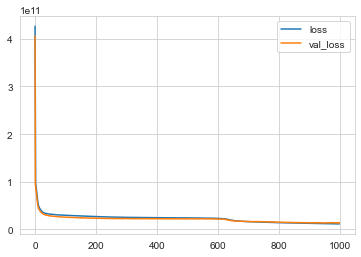

In [101]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [72]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [73]:
eval_metric(y_test, y_pred)

r2_score: 0.7687863098362145 
mae: 104089.53272569444 
mse: 29634688541.661156 
rmse: 172147.28734912194


**Interpretation:** The R2 of the model was decreased 0.84 to 0.76. 

# Save the Final Model

In [104]:
model.save('model_kc_house.h5')  # creates a D5 file 'my_model.h5'

## Loading Model and Scaler

In [105]:
from tensorflow.keras.models import load_model

In [106]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [107]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0


In [108]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.47826087, 0.        , 0.57149751, 0.21760797,
        0.15304348, 0.00573322, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 1.        , 0.        , 0.        ]])

In [109]:
model_kc_house.predict(single_house)

array([[223894.02]], dtype=float32)

In [110]:
df.iloc[0][0]

221900.0

# Comparison with ML

### Linear Regression

In [111]:
from sklearn.linear_model import LinearRegression 

In [112]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7166590901662273 
mae: 122467.64537037037 
mse: 36403572642.49722 
rmse: 190797.20292105235


### Random Forest

In [113]:
from sklearn.ensemble import RandomForestRegressor

In [114]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8886293030442941 
mae: 64785.36375462963 
mse: 14308880631.643038 
rmse: 119619.73345415479


**Note:** In general, DL gives better scores than ML in large datasets.